<a href="https://colab.research.google.com/github/Jaseelkt007/Generative_AI_basics/blob/main/Embedding_and_token_prediction_PART2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PART -2 CONTINUES
# Why Weight Tying Allows Distant Embeddings

## Why this is happening

### 1. Weight tying means:
* Input embedding matrix $E$
* Output projection weights $W_{\text{out}} = E^T$
* The **same vectors** are used both for looking up inputs and producing output logits.

### 2. Prediction is not based on input–input similarity

The probability for `dog → barks` is computed as:
$$\text{logit}(\text{barks}) = h \cdot E_{\text{barks}}$$

where:
* $h$ = the hidden state after passing $E_{\text{dog}}$ through your MLP
* $E_{\text{barks}}$ = the embedding row for "barks"

This means:
* You're **not** directly comparing $E_{\text{dog}}$ with $E_{\text{barks}}$
* You're comparing the **transformed version** of $E_{\text{dog}}$ (which is $h$) with $E_{\text{barks}}$

### 3. Key insight:
$E_{\text{dog}}$ and $E_{\text{barks}}$ can be far apart in raw embedding space, but still produce a high logit after transformation.

## Analogy

It's like having:
* **Keys** ($E_{\text{input}}$) to put into a **machine** (MLP)
* The machine spits out a **query vector**
* You then compare that **query vector** to all output embeddings to pick the next word.

The key itself ($E_{\text{dog}}$) doesn't have to look like the output target key ($E_{\text{barks}}$) — the **machine in between** is what aligns them.




# Lets try Visulaize how H embedding form cluster

In [159]:
import numpy as np

def layernorm_vec(x, eps=1e-5):
    # per-vector LN (same as you used)
    m, s = np.mean(x), np.std(x)
    return (x - m) / (s + eps)

def forward_h_for_all_tokens(E, W1, b1, W2, b2):
    # returns H ∈ [V, d]: transformed embeddings for all tokens at this step
    V = E.shape[0]
    d = E.shape[1]
    H = np.zeros((V, d))
    for i in range(V):
        e  = E[i]                           # (d,)
        z1 = layernorm_vec(e @ W1 + b1)     # (h,)
        h1 = np.tanh(z1)
        z2 = layernorm_vec(h1 @ W2 + b2)    # (d,)
        h2 = np.tanh(z2)                    # (d,)
        H[i] = h2
    return H

# Build a list of H snapshots, one per training step
H_snaps = [forward_h_for_all_tokens(Es, W1s, b1s, W2s, b2s)
           for Es, W1s, b1s, W2s, b2s in zip(snaps_E, snaps_W1, snaps_b1, snaps_W2, snaps_b2)]


# Why We Transform Embeddings Instead of Direct Lookup

## Why we don't just query the embedding table directly

If we only did:
$$\text{next token} = \arg\max_j \; \text{cosine}(E_x, E_j)$$

then:
* Predictions would only depend on **raw embedding similarity**
* The embedding table would have to **store all possible contextual meanings** of each token by itself
* That would be **too rigid** — "dog" would always be close to "barks," even in contexts where it shouldn't be (e.g., "hot dog")

## Why we *transform* embeddings first

1. **Embeddings store base meanings** — kind of like dictionary entries for tokens, not full sentence meaning.

2. The **MLP + attention layers** mix information from the current token **and its context**.

3. That transformed vector $h$ now contains:
   * Semantic meaning
   * Syntactic role
   * Contextual hints

4. Comparing $h$ to $E$ means:
   * You can produce **different predictions for the same token** in different contexts.
   * Example:
     * In "dog barks loudly" → $h_{\text{dog}}$ → high similarity with "barks"
     * In "hot dog is tasty" → $h_{\text{dog}}$ → high similarity with "is"

## Why it works mathematically

The embedding table $E$ is just a set of **basis vectors** in $\mathbb{R}^d$. The network learns a mapping:
$$f_{\theta}(E_{x_1}, E_{x_2}, \dots) \to h$$

that projects the context into the same $\mathbb{R}^d$ space **where output embeddings live**.

Because we tie weights ($W_{\text{out}} = E^T$), the model learns:
* To shape $E$ so it's good both for **input lookup** and **output matching**.
* To shape the transformation $f_{\theta}$ so that $h$ lands near the correct output vector.

## "True ideal" scenario

If you wanted to **just query the embedding matrix directly**:
* You'd basically be doing a **nearest neighbor search** without any learned transformation.
* This would work only for **static meaning** (e.g., word2vec analogy tasks).
* But you'd lose **context sensitivity**, which is why GPT, BERT, etc. **must** have those nonlinear transformations.

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


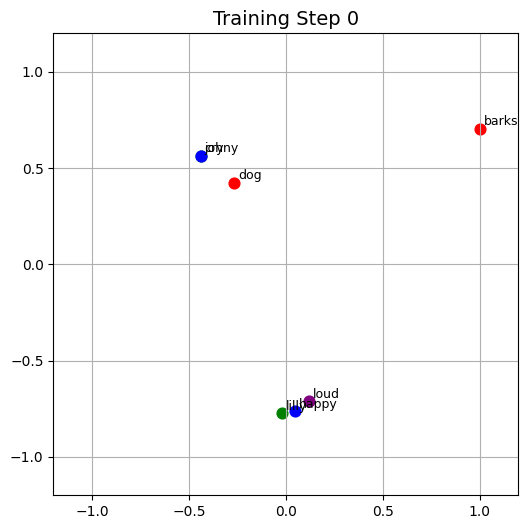

In [160]:
# !pip install umap-learn
import umap
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Fit UMAP once on all h-vectors across time for stable axes
H_all = np.vstack(H_snaps)         # [steps*V, d]
reducer = umap.UMAP(n_neighbors=4, min_dist=0.1, random_state=42)
reducer.fit(H_all)

# Transform each step
H2_snaps = [reducer.transform(H) for H in H_snaps]   # list of [V, 2]

# Normalize each frame to [-1, 1] for a stable, zoomed-in view
H2_norm = []
for coords in H2_snaps:
    c = coords - coords.mean(0)
    c = c / (np.abs(c).max() + 1e-9)
    H2_norm.append(c)

# Color clusters (same as before)
cluster_map = {
    "dog": 0, "barks": 0,
    "johny": 1, "happy": 1,
    "lilly": 2, "cry": 2,
    "loud": 3
}
cluster_colors = {0:"red", 1:"blue", 2:"green", 3:"purple"}

# Animate (no trajectories)
xmin, ymin, xmax, ymax = -1.2, -1.2, 1.2, 1.2
fig, ax = plt.subplots(figsize=(6,6))

def update(frame):
    ax.clear()
    ax.set_title(f"Training Step {frame}", fontsize=14)
    coords = H2_norm[frame]
    for i, (x, y) in enumerate(coords):
        tok = id_to_token[i]
        ax.scatter(x, y, s=60, color=cluster_colors[cluster_map[tok]])
        ax.text(x+0.02, y+0.02, tok, fontsize=9)
    ax.set_xlim(xmin, xmax); ax.set_ylim(ymin, ymax)
    ax.grid(True)

ani = FuncAnimation(fig, update, frames=len(H2_norm), interval=150)
HTML(ani.to_jshtml())

# Optional save
# from matplotlib.animation import PillowWriter
# ani.save("h_space_umap.gif", writer=PillowWriter(fps=10))


# Now lets do it with Pytorch with its latest tools like .weights, detach()

Following things are done here:

* uses weight tying (output = embedding.weight.T)
* has a 2‑layer MLP (embedding → h → logits)
* records snapshots every N steps (to keep RAM small)
* visualizes the transformed space h (the thing the model actually compares to embeddings)

In [161]:
import torch, torch.nn as nn, torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# --- Toy vocab & pairs
vocab = ['dog','barks','loud','johny','happy','lilly','cry']
token_to_id = {t:i for i,t in enumerate(vocab)}
id_to_token = {i:t for t,i in token_to_id.items()}
pairs = [('dog','barks'),('barks','loud'),('johny','happy'),('lilly','cry')]
train_data = torch.tensor([(token_to_id[x], token_to_id[y]) for x,y in pairs])

# --- Model
class TinyTiedLM(nn.Module):
    def __init__(self, V, d=8, h=16, use_layernorm=True):
        super().__init__()
        self.embedding = nn.Embedding(V, d)
        self.lin1 = nn.Linear(d, h)
        self.ln1  = nn.LayerNorm(h) if use_layernorm else nn.Identity()
        self.lin2 = nn.Linear(h, d)
        self.ln2  = nn.LayerNorm(d) if use_layernorm else nn.Identity()
        # no lm_head: we tie to embedding.weight.T at forward time

    def forward(self, x_ids):
        # x_ids: [B]
        e  = self.embedding(x_ids)               # [B, d]
        h1 = torch.tanh(self.ln1(self.lin1(e)))  # [B, h]
        h2 = torch.tanh(self.ln2(self.lin2(h1))) # [B, d]
        logits = h2 @ self.embedding.weight.T    # tied head: [B, V]
        return logits, h2

    def all_h(self):
        with torch.no_grad():
            all_ids = torch.arange(self.embedding.num_embeddings)
            _, H = self.forward(all_ids) # H vector for all tokens
            return H.cpu()                       # [V, d]

V = len(vocab)
model = TinyTiedLM(V, d=8, h=16, use_layernorm=True)
opt = torch.optim.Adam(model.parameters(), lr=0.05, weight_decay=1e-4)  # decay helps stability
loss_fn = nn.CrossEntropyLoss()

# --- Training (memory-friendly snapshots)
steps = 120
snapshot_every = 4
H_snaps = []   # list of [V, d] tensors
E_snaps = []   # optional, not used for viz here

def clip_grad_(params, max_norm=1.0):
    torch.nn.utils.clip_grad_norm_(params, max_norm) # Prevent Gradient explosion, computes global L2 norm,if that norm is greater than maxnorm and then it rescales all grads so total norm equals to max norm

for step in range(steps):
    total = 0.0
    for x_id, y_id in train_data:
        logits, h = model(x_id.view(1))
        loss = loss_fn(logits, y_id.view(1))
        opt.zero_grad()
        loss.backward()
        clip_grad_(model.parameters(), max_norm=1.0) # applied before weight updates
        opt.step()
        total += loss.item()

    if (step % 10) == 0:
        print(f"[step {step:03d}] avg loss per pair: {total/len(train_data):.4f}")

    if step % snapshot_every == 0:
        H_snaps.append(model.all_h())                  # Captures h2 for all tokens at that step [V,d]
        E_snaps.append(model.embedding.weight.detach().cpu().clone())  # (embedding matrix -> breaks from autograd so it won't keep history -> move to cpu -> make a copy )

# --- Quick sanity: top-1 predictions
def predict(tok):
    with torch.no_grad():
        i = torch.tensor([token_to_id[tok]])
        logits, _ = model(i)
        probs = logits.softmax(-1)[0].cpu().numpy() # shape : [batch, vocab]-> softmax over last dim, single token
        top = probs.argsort()[::-1][:3]
        print(f"\nInput: {tok}")
        for r,j in enumerate(top,1):
            print(f"{r}. {id_to_token[j]}  p={probs[j]:.3f}")

for t in ["dog","barks","johny","lilly"]:
    predict(t)

[step 000] avg loss per pair: 2.4899
[step 010] avg loss per pair: 0.0092
[step 020] avg loss per pair: 0.0033
[step 030] avg loss per pair: 0.0023
[step 040] avg loss per pair: 0.0017
[step 050] avg loss per pair: 0.0014
[step 060] avg loss per pair: 0.0012
[step 070] avg loss per pair: 0.0010
[step 080] avg loss per pair: 0.0009
[step 090] avg loss per pair: 0.0008
[step 100] avg loss per pair: 0.0008
[step 110] avg loss per pair: 0.0007

Input: dog
1. barks  p=0.999
2. loud  p=0.000
3. johny  p=0.000

Input: barks
1. loud  p=0.999
2. happy  p=0.000
3. cry  p=0.000

Input: johny
1. happy  p=0.999
2. loud  p=0.000
3. johny  p=0.000

Input: lilly
1. cry  p=0.999
2. loud  p=0.000
3. lilly  p=0.000


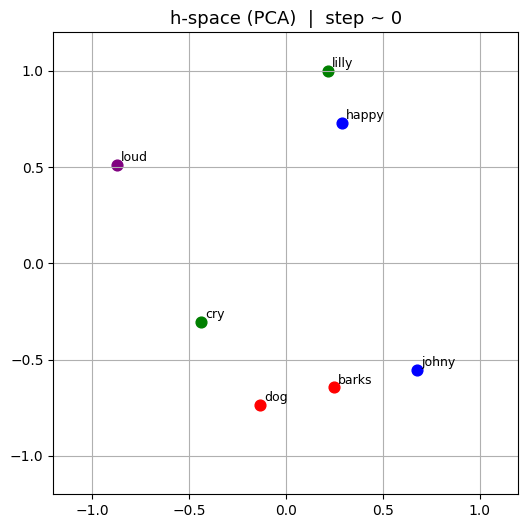

In [162]:
from sklearn.decomposition import PCA
# stack all H to fit PCA once (stable axes)
H_all = torch.cat(H_snaps, dim=0).numpy()   # [T*V, d]
pca = PCA(n_components=2)
pca.fit(H_all)

H2_snaps = [pca.transform(H.numpy()) for H in H_snaps]  # each [V,2]

# Normalize each frame to [-1,1] for a stable zoom
H2_scaled = []
for C in H2_snaps:
    Cc = C - C.mean(0, keepdims=True)
    Cc = Cc / (np.abs(Cc).max() + 1e-9)
    H2_scaled.append(Cc)

# --- Cluster colors (pairs share color)
cluster_map = {
    "dog":0, "barks":0,
    "johny":1, "happy":1,
    "lilly":2, "cry":2,
    "loud":3,
}
cluster_colors = {0:"red",1:"blue",2:"green",3:"purple"}

# --- Animate (no trajectories; stable limits)
xmin=ymin=-1.2; xmax=ymax=1.2
fig, ax = plt.subplots(figsize=(6,6))

def frame(i):
    ax.clear()
    coords = H2_scaled[i]
    ax.set_title(f"h‑space (PCA)  |  step ~ {i*snapshot_every}", fontsize=13)
    for idx,(x,y) in enumerate(coords):
        tok = id_to_token[idx]
        ax.scatter(x, y, s=60, color=cluster_colors[cluster_map[tok]])
        ax.text(x+0.02, y+0.02, tok, fontsize=9)
    ax.set_xlim(xmin, xmax); ax.set_ylim(ymin, ymax); ax.grid(True)

ani = FuncAnimation(fig, frame, frames=len(H2_scaled), interval=180)
HTML(ani.to_jshtml())